In [129]:
from itertools import islice
from typing import Callable

import matplotlib.pyplot as plt
import numpy as np
import torch as t
import torch.nn as nn
import torch.nn.functional as F
from beartype import beartype as typed
from beartype.door import die_if_unbearable as assert_type
from datasets import load_dataset
from einops import einops as ein
from jaxtyping import Bool, Float, Int
from torch import Tensor as TT
from transformers import AutoModelForCausalLM, AutoTokenizer

from activation_analysis import fit_linear, fit_module
from utils import ls, sh
from tqdm import tqdm

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
model = AutoModelForCausalLM.from_pretrained("Mlxa/brackets-nested")
tokenizer = AutoTokenizer.from_pretrained("Mlxa/brackets-nested")
dataset = load_dataset("Mlxa/nested", streaming=True)["train"]

In [8]:
from utils import sh, ls
from activation_analysis import (
    input_output_mapping,
    fit_linear,
    eval_module,
    Residual,
    PrefixMean,
    get_activations,
    squeeze_batch,
)


@typed
def get_prompts(n: int) -> list[str]:
    return [elem["text"] for elem in islice(dataset, n)]

In [304]:
from sparse_autoencoders import fit_sae, SparseAutoEncoder

layer = "transformer.h.2"
# activation_data = t.load("activations/L1_mlp.pt")

In [587]:
prefixes = t.load("activations/prefixes.list")

In [593]:
for i in range(8):
    for layer in [
        f"transformer.h.{i}",
        f"transformer.h.{i}.mlp",
        f"transformer.h.{i}.attn.attention",
    ]:
        activations: list[Float[TT, "d"]] = []

        for prefix in tqdm(prefixes):
            _, full_activations = get_activations(model, tokenizer, prefix)
            activations.append(squeeze_batch(full_activations[layer])[-1].detach())

        t.save(t.stack(activations), f"activations/{layer}.pt")

100%|██████████| 100000/100000 [20:45<00:00, 80.28it/s]


In [249]:
position_embeddings = model.transformer.wpe(t.arange(512)).detach()

In [582]:
@typed
def get_known_features(prompt: str) -> Float[TT, "d"]:
    tokens = t.tensor(tokenizer.encode(prompt))
    assert max(tokens) < len(tokenizer) - 2

    max_balance, max_token, n = 20, 500, len(tokens)
    last_token = t.zeros(max_token)
    token_sum = t.zeros(max_token)
    balance_bins = t.zeros(max_balance)

    last_token[tokens[-1]] = 1
    token_sum = t.scatter_add(token_sum, 0, tokens, t.ones(n))
    balance_bins[min((2 * (tokens % 2 == 0) - 1).sum(), max_balance - 1)] = 1

    pe = t.zeros(20)
    pe[min(n, 19)] = 1

    return t.cat(
        [
            last_token,
            token_sum,
            token_sum / np.sqrt(n),
            last_token / np.sqrt(n),
            balance_bins,
            pe,
        ],
        dim=0,
    )

In [584]:
K = t.stack([get_known_features(prefix) for prefix in tqdm(prefixes)])
A = t.stack(activations)
print(sh(K), sh(A))

  0%|          | 0/100000 [00:00<?, ?it/s]

100%|██████████| 100000/100000 [00:28<00:00, 3511.04it/s]


[100000, 2040] [100000, 256]


In [586]:
from sklearn.metrics import r2_score

val_size = 1000
K2A = fit_linear(K[:-val_size], A[:-val_size], reg="l2", alpha=1e-8)
R = (A - K2A(K)).detach()
print("baseline mse", A.square().mean().item())
print("train mse", R[:-val_size].square().mean().item())
print("val mse", R[-val_size:].square().mean().item())
print()
print("train r2", r2_score(A[:-val_size], K2A(K[:-val_size]).detach()))
print("val r2", r2_score(A[-val_size:], K2A(K[-val_size:]).detach()))

baseline mse 296.90478515625
train mse 6.3432817459106445
val mse 6.679325103759766

train r2 0.9160245095689089
val r2 0.9089718385762132


In [326]:
sae = SparseAutoEncoder(256, 512)

In [310]:
others = [SparseAutoEncoder(256, d) for d in [32, 128]]

In [477]:
for other in others:
    fit_sae(other, R, lr=1e-3, l1=0.1, alpha=1e-4, epochs=100)

100%|██████████| 100/100 [00:05<00:00, 16.78it/s,  loss=0.00, nonzero=70.26 / 128, nonorth=0.01]


In [478]:
fit_sae(sae, R, lr=1e-3, l1=0.3, alpha=1e-6, epochs=100)

  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:12<00:00,  8.21it/s,  loss=0.00, nonzero=173.32 / 512, nonorth=0.00]


In [479]:
import plotly.express as px

for ae in [sae] + others:
    perm = t.argsort(-t.norm(ae.decoder, dim=1))
    covar = (ae.decoder[perm] @ ae.decoder[perm].T).clip(-2, 2)
    px.imshow(covar.detach()).show()

# pairs = []
# for i in range(covar.shape[0]):
#     for j in range(covar.shape[1]):
#         if i < j and covar[i, j] < -0.5:
#             print(covar[i, j])
#             assert covar[i, j] < -0.7
#             pairs.append((i, j))

In [480]:
with t.no_grad():
    some_activations = A
    guess = sae.encode(some_activations)
    other_guesses = [other.encode(some_activations) for other in others]

In [481]:
from sparse_autoencoders import max_cosine_similarity

sims = [max_cosine_similarity(guess, other) for other in other_guesses]
mean_sim = sum(sims) / len(sims)
print(ls(sims[0].mean()), ls(sims[0]))
print(ls(sims[1].mean()), ls(sims[1]))

0.58 [ 0.89 0.85 0.87 0.22 0.84 0.51 0.61 0.86 0.95 0.84 0.80 0.34 0.23 0.62 0.05 0.70 0.92 0.36 0.17 0.79 0.10 0.90 0.77 0.87 0.39 0.86 0.59 0.09 0.71 0.78 0.76 0.09 0.66 0.10 0.31 0.23 0.52 0.32 0.52 0.10 0.95 0.32 0.61 0.26 0.87 0.27 0.86 0.81 0.78 0.84 0.58 0.71 0.81 0.47 0.89 0.11 0.95 0.53 0.58 0.71 0.23 0.10 0.00 0.37 0.06 0.62 0.35 0.82 0.74 0.17 0.13 0.41 0.81 0.89 0.73 0.41 0.49 0.36 0.03 0.06 0.09 0.15 0.95 0.65 0.65 0.04 0.36 0.64 0.08 0.63 0.20 0.82 0.92 0.47 0.14 0.85 0.70 0.38 0.10 0.34 0.84 0.44 0.90 0.90 0.14 0.72 0.41 0.46 0.73 0.15 0.90 0.87 0.94 0.74 0.88 0.22 0.92 0.92 0.92 0.85 0.83 0.92 0.57 0.35 0.26 0.82 0.43 0.94 0.91 0.82 0.82 0.68 0.76 0.51 0.09 0.89 0.13 0.62 0.16 0.72 0.54 0.66 0.19 0.52 0.77 0.86 0.81 0.68 0.29 0.38 0.70 0.73 0.58 0.17 0.36 0.80 0.82 0.80 0.12 0.17 0.92 0.80 0.84 0.26 0.95 0.94 0.55 0.38 0.40 0.80 0.27 0.53 0.85 0.71 0.58 0.80 0.95 0.16 0.18 0.92 0.72 0.48 0.75 0.78 0.25 0.21 0.24 0.16 0.95 0.17 0.15 0.83 0.91 0.89 0.18 0.87 0.76 0.90 0.0

In [482]:
from activation_analysis import compressed_activations
from language_modeling import prompt_from_template, generate_sample, get_logprobs
import plotly.express as px
from tqdm import tqdm


compressed: list[Float[TT, "d"]] = []

for i_prefix, prefix in enumerate(tqdm(prefixes)):
    # res = compressed_activations(model, tokenizer, prefix, {layer: sae})[layer]
    res = sae.encode(R[i_prefix]).detach()
    assert_type(res, Float[TT, "d"])
    compressed.append(res)

100%|██████████| 4000/4000 [00:00<00:00, 13793.99it/s]


In [336]:
suffixes: list[str] = []
for i_prefix, prefix in enumerate(tqdm(prefixes)):
    logprobs = get_logprobs(model, tokenizer, prefix)
    next_tokens = t.multinomial(logprobs.roll(-1, dims=0).exp(), 1).squeeze().tolist()
    suffixes.append(tokenizer.convert_ids_to_tokens(next_tokens[-1]))

100%|██████████| 4000/4000 [00:36<00:00, 110.67it/s]


In [483]:
@typed
def show_activations(activations: Float[TT, "n d"], perm: Int[TT, "k"]) -> None:
    fig = px.imshow(
        activations[:, perm],
        color_continuous_scale=px.colors.diverging.RdBu,
        labels={"x": "Dimension", "y": "Prompt", "color": "Activation"},
        x=[str(elem.item()) for elem in perm],
        # y=prefixes,
        # zmin=-1,
        # zmax=1,
    )
    fig.show()


stacked: Float[TT, "n_samples d"] = t.stack(compressed)
stds = stacked.std(dim=0)
std_argsort = t.argsort(-stds)
# stacked -= stacked.mean(dim=0, keepdim=True)
# stacked /= stacked.norm(dim=0, keepdim=True)
show_activations(stacked[:100], perm=std_argsort)

In [484]:
normed = stacked[:, std_argsort[:20]].T.clone()
normed -= normed.mean(dim=1, keepdim=True)
normed /= normed.norm(dim=1, keepdim=True).max(t.tensor(1e-8))
covar = normed @ normed.T
px.imshow(covar.detach()).show()

In [485]:
stacked = t.stack(compressed)
for pos, i_prefix in enumerate(std_argsort[:]):
    print(
        f"{pos}) dim: {i_prefix.item()}\tstd: {ls(stds[i_prefix])}\tsim: {ls(sims[0][i_prefix])}\t other sim: {ls(sims[1][i_prefix])}"
    )

0) dim: 407	std: 7.08	sim: 0.95	 other sim: 1.00
1) dim: 316	std: 6.05	sim: 0.00	 other sim: 0.00
2) dim: 165	std: 5.33	sim: 0.94	 other sim: 0.99
3) dim: 123	std: 5.30	sim: 0.35	 other sim: 0.34
4) dim: 180	std: 5.21	sim: 0.72	 other sim: 0.85
5) dim: 225	std: 5.15	sim: 0.62	 other sim: 0.84
6) dim: 460	std: 5.09	sim: 0.71	 other sim: 0.71
7) dim: 344	std: 5.07	sim: 0.58	 other sim: 0.75
8) dim: 487	std: 5.04	sim: 0.61	 other sim: 0.63
9) dim: 113	std: 4.97	sim: 0.74	 other sim: 0.74
10) dim: 255	std: 4.94	sim: 0.84	 other sim: 0.88
11) dim: 101	std: 4.94	sim: 0.44	 other sim: 0.44
12) dim: 345	std: 4.93	sim: 0.52	 other sim: 0.59
13) dim: 259	std: 4.91	sim: 0.65	 other sim: 0.58
14) dim: 320	std: 4.85	sim: 0.56	 other sim: 0.63
15) dim: 157	std: 4.83	sim: 0.80	 other sim: 0.81
16) dim: 150	std: 4.81	sim: 0.70	 other sim: 0.73
17) dim: 398	std: 4.77	sim: 0.63	 other sim: 0.63
18) dim: 223	std: 4.73	sim: 0.52	 other sim: 0.57
19) dim: 210	std: 4.69	sim: 0.56	 other sim: 0.53
20) dim: 2

In [486]:
from activation_analysis import feature_effect

short_prompts = [
    ("<10 <11 <12 12> 11> 10>", 1),
    ("<3 <4 <5 5> 4> 3>", 1),
    ("<8 <2 <7 7> 2> 8>", 1),
    ("<10 <11 <12 12> 11> 10>", 2),
    ("<3 <4 <5 5> 4> 3>", 2),
]

inspected_direction = 407

for prompt, position in short_prompts:
    eps = 0.01

    effect = feature_effect(
        model,
        tokenizer,
        prompt,
        position,
        directions={layer: (sae, inspected_direction)},
        eps=eps,
    )

    d = effect.base[f"lm_head"] * 0 + effect.diff[f"lm_head"]
    print(f"{prompt} (pos={position})")

    r = 0.02 * eps
    window = 50
    px.imshow(
        d[:, :window].detach(),
        zmin=-r,
        zmax=r,
        color_continuous_scale=px.colors.diverging.RdBu,
        x=[tokenizer.decode(i) for i in range(window)],
    ).show()

    # window = 500
    # px.imshow(
    #     d[:, 1:window:2].detach(),
    #     color_continuous_scale=px.colors.diverging.RdBu,
    #     x=[tokenizer.decode(2 * i + 1) for i in range(window//2)],
    # ).show()

<10 <11 <12 12> 11> 10> (pos=1)


<3 <4 <5 5> 4> 3> (pos=1)


<8 <2 <7 7> 2> 8> (pos=1)


<10 <11 <12 12> 11> 10> (pos=2)


<3 <4 <5 5> 4> 3> (pos=2)


In [487]:
values = t.tensor([a[inspected_direction] for a in compressed])
perm = values.argsort()

for i_prefix in perm[::30]:
    print(ls(values[i_prefix]), "   \t", prefixes[i_prefix], "#", suffixes[i_prefix])

0.00    	 <250 250> <4 <238 <21 21> <159 159> 238> <182 <75 75> 182> <50 50> # <236
0.00    	 <117 117> <55 <143 <170 <74 74> 170> <67 67> <21 21> 143> # 55>
0.00    	 <221 221> <82 82> <125 <232 232> 125> # <21
0.00    	 <120 120> <60 <215 <188 188> 215> 60> <88 <204 # 204>
0.00    	 <203 203> <132 132> <90 <159 <173 173> 159> <142 <104 104> <230 # <165
0.00    	 <218 218> <111 <110 110> 111> <158 158> <212 <29 # <101
0.00    	 <189 <224 224> <211 211> 189> <16 16> <41 41> <148 # 148>
0.00    	 <16 16> <176 <242 242> <73 73> <241 241> # <138
0.00    	 <38 38> <145 <184 184> 145> <35 35> <23 23> <5 5> <80 80> <166 # <149
0.00    	 <78 78> <168 168> <99 <53 53> <144 144> # 99>
0.00    	 <59 <152 152> 59> <163 163> <230 <236 # <75
0.00    	 <64 64> <66 <91 91> <169 <72 72> 169> 66> <78 78> <17 # 17>
0.00    	 <105 105> <232 232> <140 140> <176 176> <185 <71 # <148
0.00    	 <5 <34 34> 5> <80 80> <232 232> <195 195> # <120
0.00    	 <205 <147 <130 <198 198> <213 <36 <149 149> 36> # 213>
0

segment 0: 0.00, 0.00
last open = 0.456, next open = 0.54, balance: [0. 1. 1. 2. 4.] mean = 1.74, length = [ 8.9   9.   12.   13.75 15.  ] mean = 11.508
prefix (full) 2877 [('<16', 0.005), ('<207', 0.005), ('<249', 0.005), ('<173', 0.005), ('<144', 0.004), ('<123', 0.004), ('<165', 0.004), ('<181', 0.004), ('<34', 0.004), ('<110', 0.004)]
prefix (last) 250 [('<16', 0.012), ('115>', 0.012), ('<94', 0.012), ('82>', 0.012), ('50>', 0.008), ('<166', 0.008), ('116>', 0.008), ('123>', 0.008), ('<84', 0.008), ('195>', 0.008)]
suffix (first) 250 [('<136', 0.012), ('<162', 0.012), ('142>', 0.012), ('<114', 0.012), ('<159', 0.012), ('<4', 0.012), ('204>', 0.012), ('94>', 0.012), ('35>', 0.008), ('<100', 0.008)]


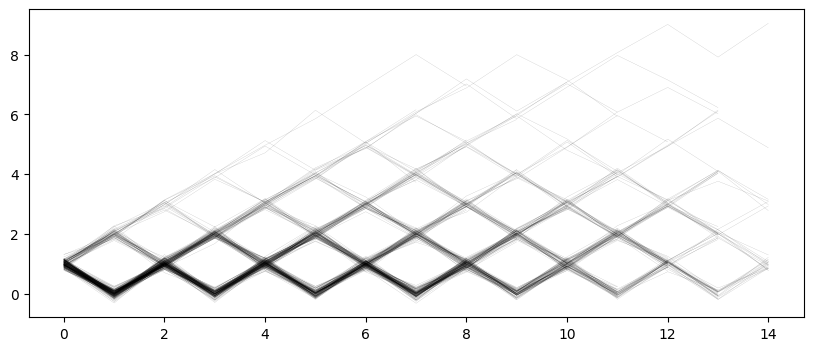


segment 1: 0.00, 0.00
last open = 0.528, next open = 0.568, balance: [0. 1. 1. 2. 4.] mean = 1.672, length = [ 8.  9. 11. 13. 15.] mean = 11.48
prefix (full) 2870 [('<110', 0.005), ('<164', 0.005), ('110>', 0.005), ('<174', 0.004), ('<248', 0.004), ('<89', 0.004), ('<132', 0.004), ('<36', 0.004), ('<34', 0.004), ('<99', 0.004)]
prefix (last) 250 [('23>', 0.02), ('119>', 0.012), ('<201', 0.012), ('<211', 0.012), ('165>', 0.008), ('<107', 0.008), ('145>', 0.008), ('203>', 0.008), ('<181', 0.008), ('<210', 0.008)]
suffix (first) 250 [('<38', 0.016), ('181>', 0.012), ('99>', 0.012), ('201>', 0.012), ('<218', 0.012), ('<23', 0.012), ('<184', 0.012), ('<37', 0.008), ('107>', 0.008), ('203>', 0.008)]


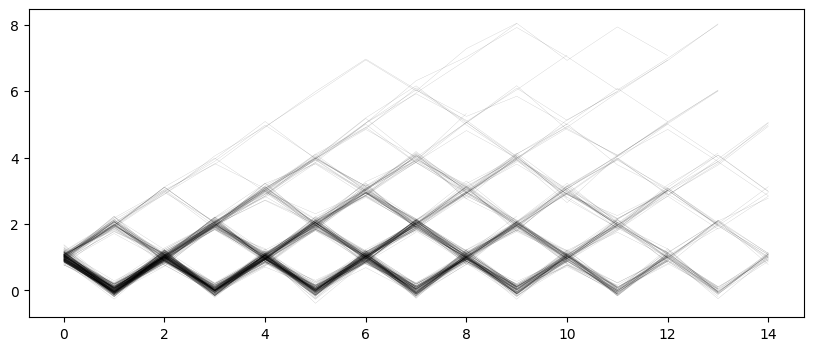


segment 2: 0.00, 0.00
last open = 0.512, next open = 0.472, balance: [0. 1. 1. 3. 4.] mean = 1.756, length = [ 8. 10. 12. 14. 15.] mean = 11.644
prefix (full) 2911 [('<45', 0.005), ('<111', 0.004), ('<34', 0.004), ('<121', 0.004), ('<180', 0.004), ('45>', 0.004), ('<2', 0.004), ('<81', 0.004), ('<88', 0.004), ('<40', 0.004)]
prefix (last) 250 [('<214', 0.012), ('29>', 0.012), ('180>', 0.012), ('<8', 0.008), ('<93', 0.008), ('236>', 0.008), ('44>', 0.008), ('151>', 0.008), ('204>', 0.008), ('109>', 0.008)]
suffix (first) 250 [('<225', 0.012), ('179>', 0.012), ('<24', 0.012), ('<42', 0.012), ('<245', 0.012), ('97>', 0.012), ('102>', 0.012), ('8>', 0.008), ('22>', 0.008), ('93>', 0.008)]


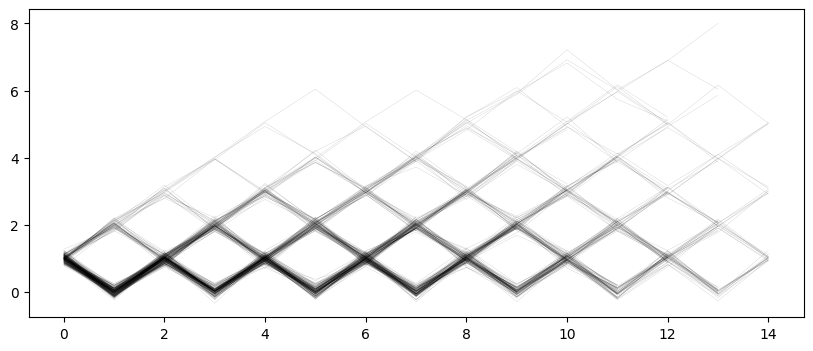


segment 3: 0.00, 0.00
last open = 0.484, next open = 0.572, balance: [0. 1. 1. 3. 4.] mean = 1.7, length = [ 9. 10. 11. 13. 15.] mean = 11.468
prefix (full) 2867 [('<53', 0.005), ('<212', 0.005), ('<129', 0.005), ('<50', 0.005), ('53>', 0.004), ('<232', 0.004), ('<226', 0.004), ('<153', 0.004), ('<215', 0.004), ('<44', 0.004)]
prefix (last) 250 [('89>', 0.016), ('53>', 0.012), ('<232', 0.012), ('<68', 0.012), ('246>', 0.012), ('76>', 0.012), ('<106', 0.008), ('116>', 0.008), ('<60', 0.008), ('198>', 0.008)]
suffix (first) 250 [('<97', 0.016), ('<1', 0.012), ('<149', 0.012), ('232>', 0.012), ('<211', 0.012), ('<6', 0.012), ('<15', 0.012), ('212>', 0.012), ('<188', 0.008), ('<42', 0.008)]


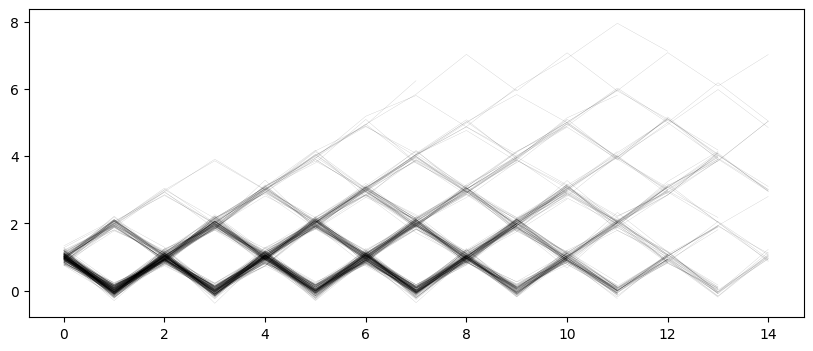


segment 4: 0.00, 0.00
last open = 0.564, next open = 0.576, balance: [0. 1. 1. 3. 4.] mean = 1.784, length = [ 8.  9. 11. 14. 15.] mean = 11.528
prefix (full) 2882 [('<92', 0.005), ('<32', 0.005), ('<104', 0.005), ('<117', 0.005), ('<7', 0.005), ('<225', 0.004), ('<157', 0.004), ('<20', 0.004), ('104>', 0.004), ('<35', 0.004)]
prefix (last) 250 [('<32', 0.016), ('195>', 0.012), ('<243', 0.012), ('<84', 0.012), ('158>', 0.012), ('<56', 0.012), ('143>', 0.012), ('<117', 0.012), ('<215', 0.008), ('<204', 0.008)]
suffix (first) 250 [('84>', 0.016), ('<42', 0.012), ('114>', 0.012), ('<203', 0.012), ('<233', 0.012), ('<135', 0.012), ('<83', 0.012), ('117>', 0.012), ('<239', 0.012), ('<145', 0.008)]


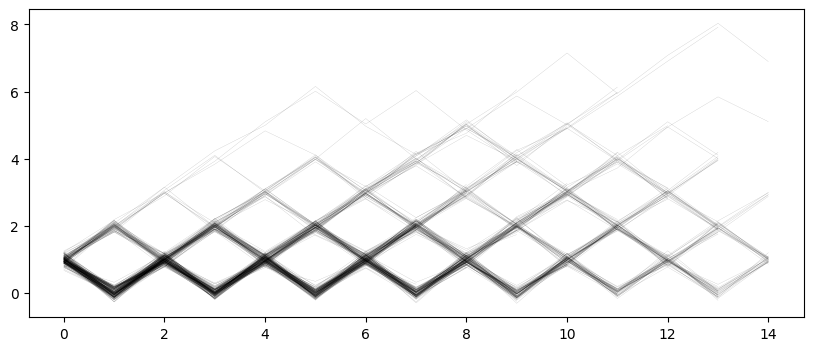


segment 5: 0.00, 0.00
last open = 0.528, next open = 0.552, balance: [0. 1. 1. 2. 4.] mean = 1.632, length = [ 8. 10. 12. 14. 15.] mean = 11.608
prefix (full) 2902 [('<192', 0.005), ('<230', 0.005), ('<170', 0.005), ('<125', 0.004), ('192>', 0.004), ('<169', 0.004), ('<127', 0.004), ('<76', 0.004), ('<181', 0.004), ('<245', 0.004)]
prefix (last) 250 [('<229', 0.012), ('127>', 0.012), ('<140', 0.012), ('46>', 0.012), ('<250', 0.012), ('17>', 0.012), ('<204', 0.012), ('<247', 0.012), ('<149', 0.008), ('64>', 0.008)]
suffix (first) 250 [('<78', 0.02), ('<243', 0.012), ('228>', 0.012), ('245>', 0.012), ('<204', 0.012), ('<207', 0.012), ('247>', 0.012), ('<5', 0.012), ('<167', 0.012), ('<18', 0.008)]


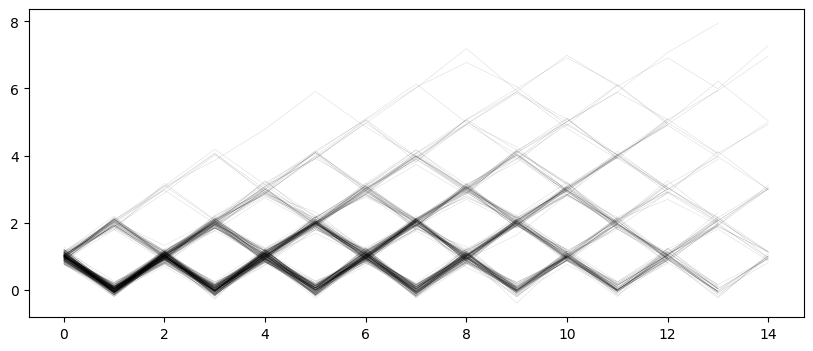


segment 6: 0.00, 0.00
last open = 0.472, next open = 0.528, balance: [0. 1. 1. 2. 4.] mean = 1.772, length = [ 8.    9.   11.   13.75 15.  ] mean = 11.38
prefix (full) 2845 [('<129', 0.005), ('<78', 0.005), ('<8', 0.005), ('<143', 0.004), ('<116', 0.004), ('8>', 0.004), ('<152', 0.004), ('<37', 0.004), ('<162', 0.004), ('<18', 0.004)]
prefix (last) 250 [('200>', 0.012), ('80>', 0.012), ('155>', 0.012), ('229>', 0.012), ('100>', 0.012), ('217>', 0.012), ('183>', 0.012), ('207>', 0.012), ('152>', 0.008), ('31>', 0.008)]
suffix (first) 250 [('73>', 0.012), ('<81', 0.012), ('<129', 0.008), ('<92', 0.008), ('181>', 0.008), ('<164', 0.008), ('<91', 0.008), ('238>', 0.008), ('<199', 0.008), ('45>', 0.008)]


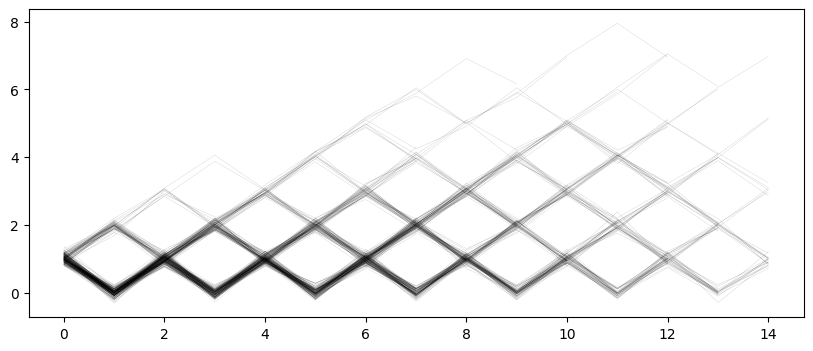


segment 7: 0.00, 0.00
last open = 0.508, next open = 0.524, balance: [0. 1. 1. 3. 4.] mean = 1.832, length = [ 8.    9.25 12.   13.   15.  ] mean = 11.424
prefix (full) 2856 [('<162', 0.005), ('<205', 0.005), ('<149', 0.005), ('<243', 0.005), ('<93', 0.005), ('<3', 0.005), ('205>', 0.004), ('<142', 0.004), ('<179', 0.004), ('<246', 0.004)]
prefix (last) 250 [('<46', 0.012), ('116>', 0.012), ('<58', 0.012), ('<88', 0.012), ('96>', 0.012), ('<73', 0.012), ('<243', 0.012), ('<167', 0.012), ('<2', 0.008), ('176>', 0.008)]
suffix (first) 250 [('<66', 0.02), ('<229', 0.016), ('<173', 0.016), ('142>', 0.012), ('88>', 0.012), ('3>', 0.012), ('167>', 0.012), ('73>', 0.012), ('<176', 0.012), ('<237', 0.012)]


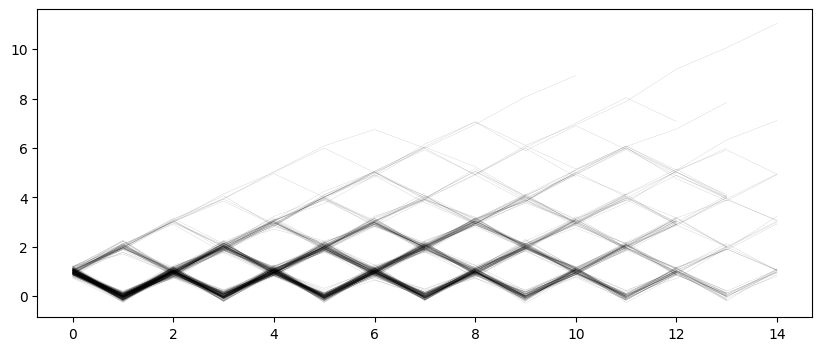


segment 8: 0.00, 0.02
last open = 0.536, next open = 0.552, balance: [0. 1. 1. 3. 4.] mean = 1.772, length = [ 8.9 10.  12.  14.  15. ] mean = 11.924
prefix (full) 2981 [('<40', 0.005), ('<130', 0.005), ('<132', 0.005), ('<62', 0.005), ('<221', 0.004), ('<63', 0.004), ('<49', 0.004), ('<124', 0.004), ('<85', 0.004), ('63>', 0.004)]
prefix (last) 250 [('63>', 0.016), ('<38', 0.012), ('<105', 0.012), ('125>', 0.012), ('<127', 0.012), ('<51', 0.012), ('<53', 0.012), ('<30', 0.012), ('<247', 0.012), ('<180', 0.008)]
suffix (first) 250 [('<144', 0.016), ('<22', 0.012), ('<15', 0.012), ('<222', 0.012), ('<130', 0.012), ('<185', 0.012), ('<17', 0.012), ('38>', 0.012), ('124>', 0.012), ('<174', 0.008)]


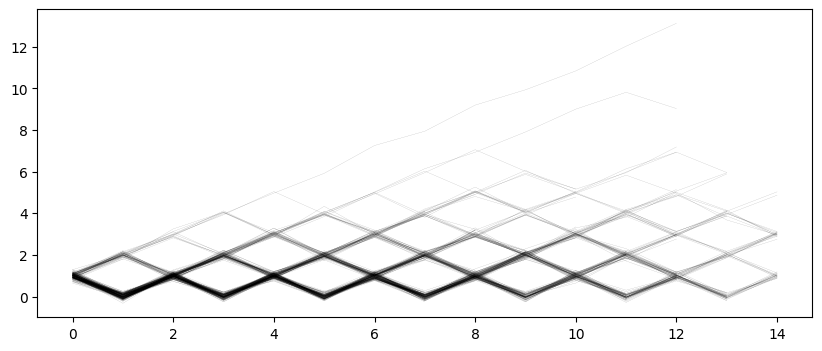


segment 9: 0.02, 1.08
last open = 0.604, next open = 0.468, balance: [0. 1. 2. 3. 4.] mean = 1.864, length = [ 8. 10. 12. 13. 15.] mean = 11.592
prefix (full) 2898 [('<102', 0.005), ('<35', 0.005), ('<204', 0.004), ('<243', 0.004), ('<66', 0.004), ('<228', 0.004), ('<29', 0.004), ('<138', 0.004), ('<225', 0.004), ('<144', 0.004)]
prefix (last) 250 [('<225', 0.02), ('<22', 0.016), ('108>', 0.012), ('<103', 0.012), ('<86', 0.012), ('<31', 0.012), ('226>', 0.012), ('<173', 0.012), ('84>', 0.008), ('<216', 0.008)]
suffix (first) 250 [('22>', 0.016), ('225>', 0.016), ('103>', 0.012), ('<187', 0.012), ('<29', 0.012), ('125>', 0.012), ('<117', 0.012), ('<142', 0.008), ('<196', 0.008), ('<84', 0.008)]


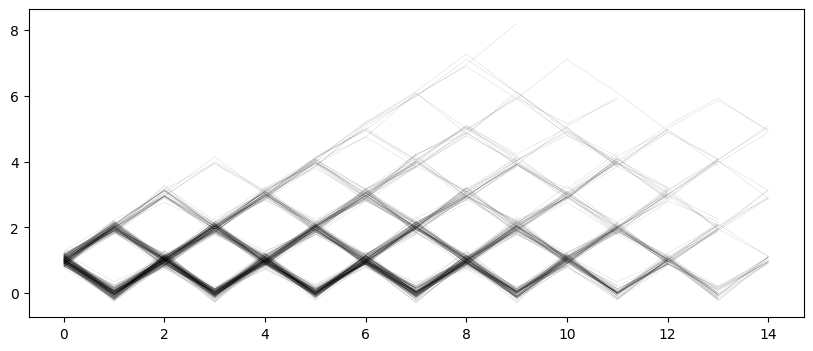


segment 10: 1.08, 2.33
last open = 0.664, next open = 0.5, balance: [0. 1. 2. 3. 4.] mean = 1.94, length = [ 8. 10. 12. 14. 15.] mean = 11.604
prefix (full) 2901 [('<96', 0.006), ('<154', 0.004), ('<34', 0.004), ('<128', 0.004), ('<142', 0.004), ('<145', 0.004), ('<242', 0.004), ('<48', 0.004), ('<79', 0.004), ('<8', 0.004)]
prefix (last) 250 [('<79', 0.016), ('<46', 0.012), ('<7', 0.012), ('<145', 0.012), ('<120', 0.012), ('<29', 0.012), ('<154', 0.012), ('<50', 0.012), ('<25', 0.012), ('<224', 0.012)]
suffix (first) 250 [('46>', 0.012), ('<53', 0.012), ('145>', 0.012), ('120>', 0.012), ('<222', 0.012), ('<52', 0.012), ('<159', 0.012), ('<218', 0.012), ('<136', 0.008), ('<45', 0.008)]


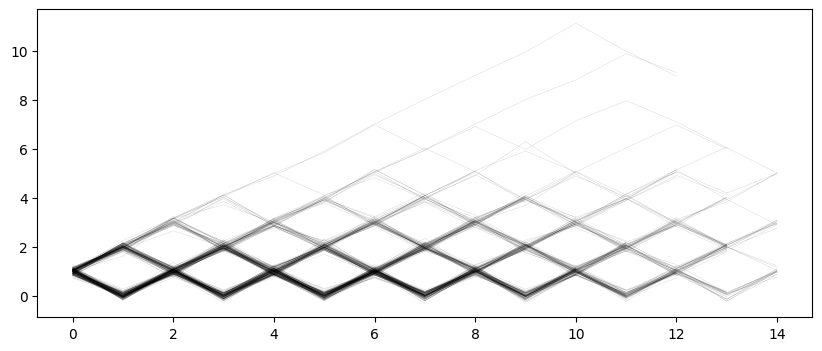


segment 11: 2.34, 3.92
last open = 0.628, next open = 0.468, balance: [0.  1.  2.  3.  4.1] mean = 2.152, length = [ 8.9 10.  12.  14.  15. ] mean = 11.832
prefix (full) 2958 [('<177', 0.005), ('<97', 0.005), ('<238', 0.004), ('<52', 0.004), ('<239', 0.004), ('<169', 0.004), ('169>', 0.004), ('<139', 0.004), ('<74', 0.004), ('<216', 0.004)]
prefix (last) 250 [('<177', 0.016), ('<230', 0.016), ('97>', 0.012), ('<106', 0.012), ('<223', 0.012), ('177>', 0.012), ('161>', 0.012), ('<62', 0.012), ('<207', 0.012), ('<34', 0.012)]
suffix (first) 250 [('34>', 0.016), ('<8', 0.012), ('147>', 0.012), ('<240', 0.012), ('71>', 0.012), ('177>', 0.008), ('<119', 0.008), ('124>', 0.008), ('<74', 0.008), ('217>', 0.008)]


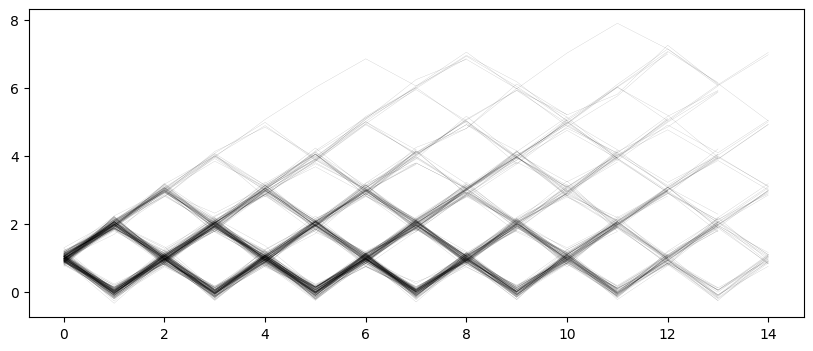


segment 12: 3.93, 5.76
last open = 0.564, next open = 0.54, balance: [0. 1. 2. 3. 4.] mean = 1.856, length = [ 8.  10.  11.5 13.  15. ] mean = 11.424
prefix (full) 2856 [('<76', 0.006), ('<1', 0.005), ('<142', 0.005), ('<8', 0.004), ('<242', 0.004), ('<57', 0.004), ('<232', 0.004), ('<196', 0.004), ('<22', 0.004), ('1>', 0.004)]
prefix (last) 250 [('98>', 0.016), ('27>', 0.012), ('<125', 0.012), ('<214', 0.012), ('<218', 0.012), ('104>', 0.012), ('137>', 0.012), ('<127', 0.012), ('<240', 0.008), ('246>', 0.008)]
suffix (first) 250 [('117>', 0.016), ('<73', 0.012), ('<194', 0.012), ('214>', 0.012), ('<100', 0.012), ('<111', 0.012), ('<23', 0.012), ('240>', 0.008), ('<64', 0.008), ('126>', 0.008)]


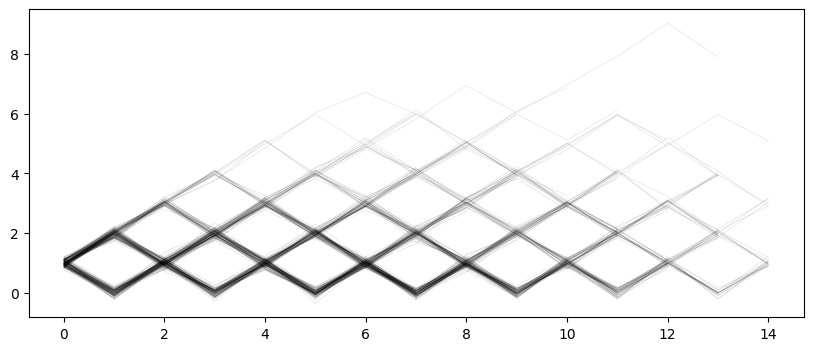


segment 13: 5.76, 8.26
last open = 0.56, next open = 0.492, balance: [0. 1. 1. 3. 5.] mean = 2.0, length = [ 8. 10. 12. 14. 15.] mean = 11.632
prefix (full) 2908 [('<194', 0.005), ('<40', 0.004), ('<145', 0.004), ('<97', 0.004), ('<174', 0.004), ('<160', 0.004), ('<42', 0.004), ('<199', 0.004), ('<53', 0.004), ('<16', 0.004)]
prefix (last) 250 [('17>', 0.016), ('<186', 0.016), ('<199', 0.012), ('<220', 0.012), ('<117', 0.012), ('149>', 0.012), ('<56', 0.012), ('194>', 0.012), ('166>', 0.012), ('34>', 0.008)]
suffix (first) 250 [('199>', 0.016), ('<122', 0.012), ('<38', 0.012), ('186>', 0.012), ('<53', 0.008), ('<207', 0.008), ('<100', 0.008), ('<158', 0.008), ('220>', 0.008), ('<111', 0.008)]


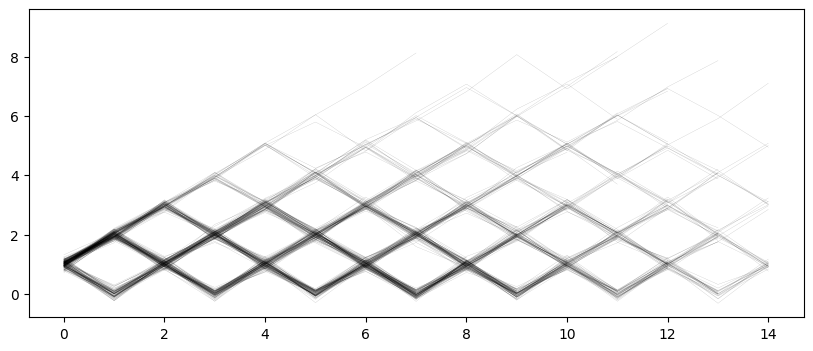


segment 14: 8.27, 13.02
last open = 0.58, next open = 0.568, balance: [0. 0. 1. 3. 4.] mean = 1.796, length = [ 8.  9. 11. 13. 15.] mean = 11.404
prefix (full) 2851 [('<144', 0.005), ('<27', 0.004), ('<140', 0.004), ('<110', 0.004), ('<117', 0.004), ('<239', 0.004), ('144>', 0.004), ('<69', 0.004), ('<1', 0.004), ('<176', 0.004)]
prefix (last) 250 [('<88', 0.008), ('<180', 0.008), ('233>', 0.008), ('66>', 0.008), ('<236', 0.008), ('<73', 0.008), ('<29', 0.008), ('<213', 0.008), ('127>', 0.008), ('125>', 0.008)]
suffix (first) 250 [('91>', 0.016), ('<204', 0.016), ('86>', 0.012), ('<101', 0.012), ('<142', 0.012), ('<38', 0.012), ('<215', 0.012), ('<224', 0.012), ('<66', 0.012), ('<235', 0.012)]


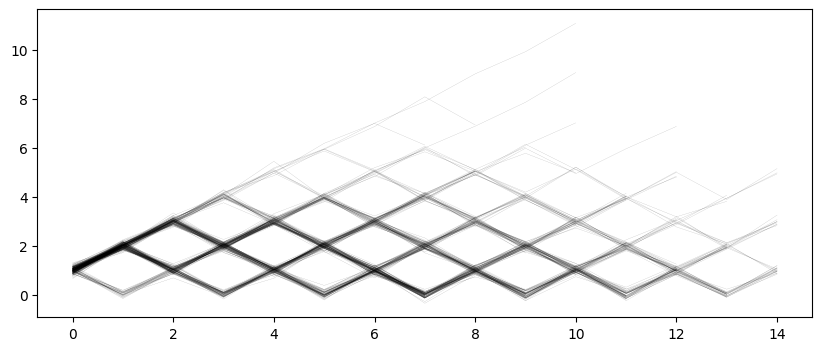


segment 15: 13.06, 81.58
last open = 0.268, next open = 0.516, balance: [0. 0. 1. 2. 3.] mean = 1.428, length = [ 8.   9.  11.  13.  14.1] mean = 11.22
prefix (full) 2805 [('<180', 0.004), ('<20', 0.004), ('<165', 0.004), ('<32', 0.004), ('<64', 0.004), ('<102', 0.004), ('<124', 0.004), ('<231', 0.004), ('<28', 0.004), ('<191', 0.004)]
prefix (last) 250 [('29>', 0.012), ('6>', 0.012), ('88>', 0.012), ('124>', 0.012), ('128>', 0.012), ('<243', 0.008), ('47>', 0.008), ('13>', 0.008), ('141>', 0.008), ('<170', 0.008)]
suffix (first) 250 [('<71', 0.012), ('<144', 0.012), ('124>', 0.012), ('180>', 0.012), ('171>', 0.012), ('84>', 0.012), ('192>', 0.012), ('177>', 0.008), ('<57', 0.008), ('<188', 0.008)]


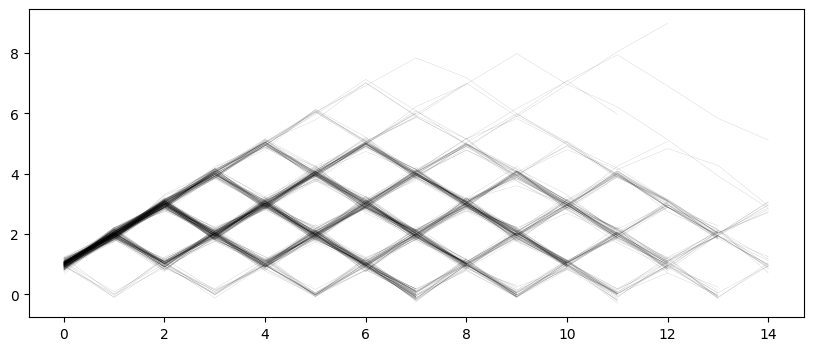

In [488]:
from language_modeling import get_balances
from collections import Counter

segments = 16
for segment in range(segments):
    l, r = segment * len(perm) // segments, (segment + 1) * len(perm) // segments
    prefix_ends_open = []
    suffix_starts_open = []
    prefix_balance = []
    prefix_length = []
    feature_values = []
    prefix_tokens = Counter()
    last_tokens = Counter()
    suffix_tokens = Counter()
    plt.figure(figsize=(10, 4))
    for i_prefix in perm[l:r]:
        balances = get_balances(prefixes[i_prefix])
        plt.plot(balances + t.randn(len(balances)) * 0.1, lw=0.1, alpha=0.5, c="k")
        feature_values.append(values[i_prefix].item())
        prefix_balance.append(balances[-1].item())
        prefix_length.append(len(tokenizer.tokenize(prefixes[i_prefix])))
        suffix_starts_open.append(suffixes[i_prefix].startswith("<"))
        prefix_ends_open.append(not prefixes[i_prefix].endswith(">"))
        prefix_tokens.update(tokenizer.tokenize(prefixes[i_prefix]))
        last_tokens.update(tokenizer.tokenize(prefixes[i_prefix])[-1:])
        suffix_tokens.update(tokenizer.tokenize(suffixes[i_prefix])[:1])
    avg = lambda x: sum(x) / len(x)
    Counter.get_freqs = lambda self: [
        (k, round(v / self.total(), 3)) for k, v in self.most_common(10)
    ]
    print(f"segment {segment}: {ls(min(feature_values))}, {ls(max(feature_values))}")
    # idx_to_check = [
    #     tokenizer.encode(s)[0] for s in ["<4", "4>", "<8", "8>", "<12", "12>"]
    # ]
    # print(
    #     *idx_to_check, ":", tokenizer.decode(idx_to_check), ":", *[suffix_tokens[i] for i in idx_to_check]
    # )
    print(
        f"last open = {avg(prefix_ends_open)}, next open = {avg(suffix_starts_open)}, balance: {np.quantile(prefix_balance, [0.1, 0.25, 0.5, 0.75, 0.9])} mean = {avg(prefix_balance)}, length = {np.quantile(prefix_length, [0.1, 0.25, 0.5, 0.75, 0.9])} mean = {avg(prefix_length)}"
    )
    print("prefix (full)", prefix_tokens.total(), prefix_tokens.get_freqs())
    print("prefix (last)", last_tokens.total(), last_tokens.get_freqs())
    print("suffix (first)", suffix_tokens.total(), suffix_tokens.get_freqs())
    plt.show()
    print()

In [ ]:
X_reg = []
Y_reg = []

for i_prefix in tqdm(range(len(prefixes))):
    tokens = tokenizer.encode(prefixes[i_prefix])
    counts = t.zeros(len(tokenizer))
    for i_token in range(len(tokens)):
        counts[tokens[i_token]] += 1
    last = t.zeros(len(tokenizer))
    last[tokens[-1]] = 1
    n_freqs = 300
    freqs = t.zeros(2 * n_freqs)
    p_len = t.tensor(len(tokens), dtype=t.float32)
    waves = t.logspace(0.0, 9.0, steps=n_freqs, base=2)
    freqs[::2] = t.sin(2 * t.pi * p_len / waves)
    freqs[1::2] = t.cos(2 * t.pi * p_len / waves)
    X_reg.append(t.cat((counts, last, freqs), dim=0))
    Y_reg.append(compressed[i_prefix])

X_reg = t.stack(X_reg)
Y_reg = t.stack(Y_reg)

  0%|          | 0/32000 [00:00<?, ?it/s]

100%|██████████| 32000/32000 [00:07<00:00, 4245.66it/s]


In [ ]:
from sklearn.linear_model import Ridge
from activation_analysis import fit_linear, fit_module
from sparse_autoencoders import random_ortho


@typed
def orth_linear(n: int, m: int) -> nn.Linear:
    result = nn.Linear(n, m)
    result.weight.data = random_ortho(m, n)
    return result


# reg = nn.Sequential(fit_linear(X_reg, Y_reg, reg="l2", alpha=1e-4), nn.ReLU()) # nn.LeakyReLU(negative_slope=0.01))
# reg = nn.Sequential(
#     nn.Linear(1604, 128),
#     nn.LayerNorm(128, elementwise_affine=False, bias=False),
#     nn.Linear(128, 64),
#     nn.LeakyReLU(negative_slope=0.001),
# )
fit_module(reg, X_reg, Y_reg, lr=1e-3, l1=1e-3, batch_size=512, epochs=40)

100%|██████████| 40/40 [00:29<00:00,  1.34it/s,  loss: 0.53]


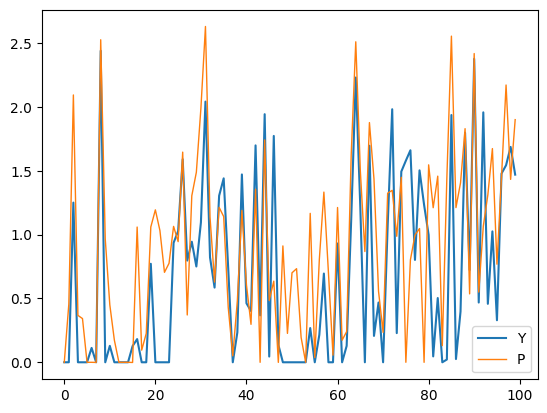

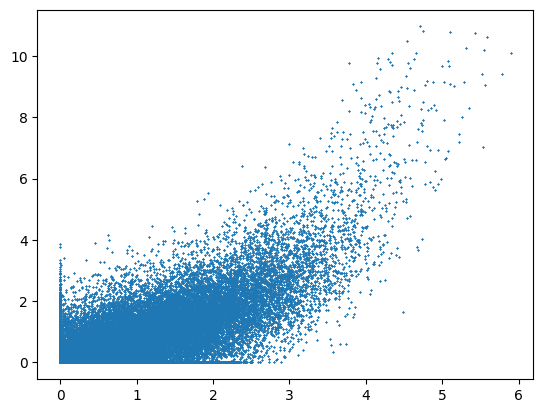

In [ ]:
P_reg = reg(X_reg).detach()



@typed
def explore_dim(dim: int) -> None:
    k = 10**2
    plt.plot(Y_reg[:k, dim], label="Y")
    plt.plot(P_reg[:k, dim], label="P", lw=1)
    plt.legend()
    plt.show()
    plt.plot(P
_reg[:, dim], Y_reg[:, dim], "x", ms=1)
    plt.show()


explore_dim(11)

In [ ]:
from sklearn.metrics import r2_score

for i_prefix in std_argsort:
    y = Y_reg[:, i_prefix]
    p = P_reg[:, i_prefix]
    # c = reg[0].weight.detach()[i_prefix]
    # c[:500] *= ((-1) ** np.arange(500))
    print(ls(i_prefix), ls(stds[i_prefix]), ls(r2_score(y, p)), sep="\t", end="\t")
    print()

2	8.57	0.97	
29	7.10	0.97	
51	5.27	0.96	
27	4.53	0.97	
21	4.37	0.95	
48	4.29	0.97	
34	4.09	0.98	
18	3.77	0.96	
54	3.74	0.97	
13	3.55	0.96	
6	3.51	0.96	
56	3.47	0.96	
43	3.45	0.87	
49	3.44	0.95	
8	3.35	0.97	
52	3.19	0.94	
28	3.17	0.87	
1	3.14	0.97	
5	3.04	0.97	
26	3.02	0.95	
58	3.02	0.95	
53	2.93	0.90	
22	2.89	0.96	
10	2.89	0.97	
17	2.87	0.97	
0	2.83	0.91	
23	2.82	0.97	
47	2.80	0.97	
39	2.78	0.95	
12	2.75	0.95	
62	2.63	0.97	
25	2.54	0.95	
57	2.52	0.97	
14	2.45	0.96	
32	2.25	0.95	
59	2.20	0.88	
9	2.03	0.94	
4	1.98	0.85	
35	1.87	0.94	
44	1.86	0.70	
36	1.84	0.71	
33	1.78	0.81	
40	1.77	0.72	
50	1.70	0.69	
20	1.56	0.61	
60	1.55	0.57	
46	1.53	0.67	
38	1.52	0.86	
30	1.35	0.61	
61	1.17	0.59	
11	1.16	0.48	
41	1.16	0.76	
63	0.94	0.78	
16	0.93	0.63	
42	0.84	0.68	
24	0.84	0.50	
55	0.81	0.68	
15	0.76	0.66	
31	0.73	0.79	
19	0.00	0.00	
45	0.00	0.00	
7	0.00	0.00	
37	0.00	0.00	
3	0.00	0.00	


In [ ]:
@typed
def perm_importance(in_feature: int, k: int = 3) -> Float[TT, "out_features"]:
    result = 0
    for _ in range(k):
        X_new = X_reg.clone()
        X_new[:, in_feature] = X_new[:, in_feature][t.randperm(X_new.shape[0])]
        pred = reg(X_new).detach()
        scores = [r2_score(Y_reg[:, i], pred[:, i]) for i in std_argsort]
        result += t.tensor(scores)
    return result / k


composite /= composite.std(dim=1, keepdim=True)
print(sh(composite))

[64, 1604]


In [ ]:
for i in std_argsort:
    a = composite[i, :500].std()
    b = composite[i, 500:1000].std()
    cosd_pe = composite[i, 1000:].std()
    print(ls(i), "\t", ls(a), ls(b), ls(cosd_pe))

2 	 1.77 0.26 0.03
29 	 0.78 1.59 0.18
51 	 1.70 0.56 0.05
27 	 1.77 0.20 0.03
21 	 1.69 0.58 0.05
48 	 1.75 0.39 0.03
34 	 1.74 0.43 0.04
18 	 1.73 0.47 0.04
54 	 1.73 0.48 0.04
13 	 1.75 0.39 0.04
6 	 1.70 0.55 0.04
56 	 1.72 0.51 0.04
43 	 1.57 0.86 0.07
49 	 1.70 0.56 0.04
8 	 1.76 0.35 0.04
52 	 1.67 0.66 0.05
28 	 1.50 0.98 0.05
1 	 1.72 0.52 0.05
5 	 1.74 0.41 0.04
26 	 1.65 0.69 0.05
58 	 1.67 0.64 0.04
53 	 1.67 0.63 0.07
22 	 1.71 0.51 0.09
10 	 1.73 0.48 0.05
17 	 1.75 0.40 0.03
0 	 1.63 0.72 0.07
23 	 1.72 0.50 0.05
47 	 1.73 0.45 0.04
39 	 1.72 0.51 0.05
12 	 1.69 0.59 0.04
62 	 1.75 0.37 0.04
25 	 1.69 0.58 0.10
57 	 1.71 0.52 0.04
14 	 1.71 0.54 0.04
32 	 1.66 0.67 0.04
59 	 1.66 0.68 0.05
9 	 1.64 0.71 0.06
4 	 1.63 0.73 0.09
35 	 1.66 0.68 0.05
44 	 1.48 0.99 0.07
36 	 1.55 0.89 0.07
33 	 1.60 0.81 0.07
40 	 1.42 1.09 0.05
50 	 1.46 1.03 0.07
20 	 1.40 1.11 0.07
60 	 1.29 1.24 0.05
46 	 1.31 1.22 0.05
38 	 1.54 0.92 0.05
30 	 1.32 1.20 0.12
61 	 1.12 1.40 0.06
11 	 1.3

In [ ]:
from activation_analysis import compressed_activations

for feature in std_argsort[:10]:
    plt.figure(figsize=(10, 5))
    for _ in tqdm(range(300)):
        user_input = prompt_from_template("(())(((())))(((())))((()))(())", random=True)
        cur = compressed_activations(model, tokenizer, user_input, {layer: sae})[layer]
        feature_values = cur[:, feature] / stds[feature]
        plt.plot(feature_values, lw=0.1, alpha=0.1, c="k")
    plt.show()

<151 <82 <140 <211 211> 140> 82> 151> <250 <67 <152 152> 67> 250>
407: [ 204.77 123.64 130.56 124.14 69.30 48.45 78.94 22.12 16.16 13.62 0.61 1.96 12.71 5.22 ]


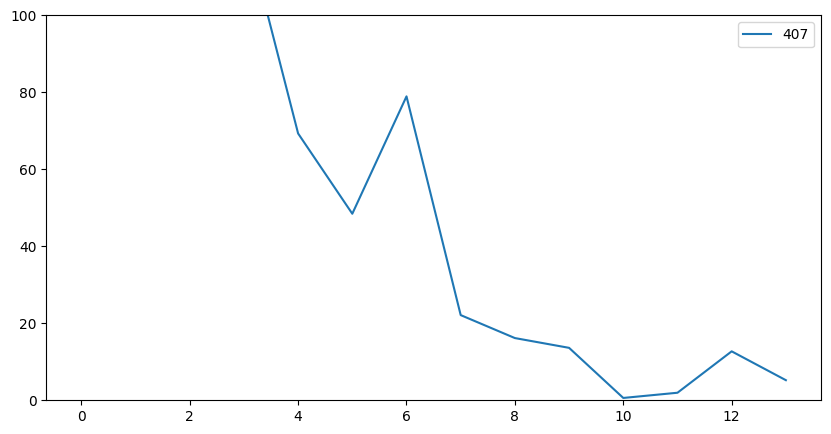

In [562]:
@typed
def explore_input(user_input: str, features: list[int]) -> None:
    if any(x >= len(tokenizer) - 2 for x in tokenizer.encode(user_input)):
        print("Invalid input. Please try again.")
    _, full_activations = get_activations(model, tokenizer, user_input)
    tokens = tokenizer.tokenize(user_input)
    kf = t.stack(
        [get_known_features(" ".join(tokens[:pr])) for pr in range(1, len(tokens) + 1)]
    )
    activations = squeeze_batch(full_activations[layer]).detach()
    residuals = activations - K2A(kf).detach()
    cur = sae.encode(residuals).detach()
    plt.figure(figsize=(10, 5))
    plt.ylim(0, 100)
    print(user_input)
    for feature in features:
        feature_values = cur[:, feature]
        print(f"{feature}: {ls(feature_values)}")
        plt.plot(feature_values, label=feature)
    plt.legend()
    plt.show()


features = [std_argsort[0].item()]
# prompt = "<1 <2 <3 <4 4> 3> 2> 1> <5 <7 <8 8> 7> 5>"
prompt = prompt_from_template("(((())))((()))", random=True)
# prompt = "<10 <11 <12 <13 13> 12> 11> 10> <8 <7 <6 6> 7> 8> <184 <156 156> 184> <15 <224 224> 15> <238 <130 130> 238>"
explore_input(prompt, features)